In [1]:
import numpy as np
import pandas as pd

from scipy import stats, special, spatial

import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.lines import Line2D
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

import importlib.util
import os

import warnings
warnings.filterwarnings('ignore')

#s.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
def coeff_determination(y_true, y_pred):
    SS_res =  np.sum(np.square(y_true-y_pred))
    SS_tot = np.sum(np.square(y_true-np.mean(y_true)))
    return (1-SS_res/(SS_tot+1e-8))


In [3]:
def get_rsd(x):
    return x.std()/x.mean()

def dynamic_range(x):
    return np.log10(max(x)-min(x))

def signal2noise(x):
    return np.median(x)/np.std(x)

def boxtpm(x, lmbda):
    return special.inv_boxcox(x, lmbda)

def fix_pvals(x):
    if x < 1e-16:
        x=1e-16
    return x

def coeff_determination(y_true, y_pred):
    SS_res =  np.sum(np.square(y_true-y_pred))
    SS_tot = np.sum(np.square(y_true-np.mean(y_true)))
    return (1-SS_res/(SS_tot+1e-8))

def boxtpm(x, lmbda):
    return special.inv_boxcox(x, lmbda)

#https://stackoverflow.com/questions/30657453/fitting-a-straight-line-to-a-log-log-curve-in-matplotlib
def powerfit(x, y, xnew):
    """line fitting on log-log scale"""
    k, m = np.polyfit(np.log(x), np.log(y), 1)
    return np.exp(m) * xnew**(k)

In [4]:
def load_module(model_path):
    '''loads module containing models given path'''
    spec = importlib.util.spec_from_file_location('module',model_path)
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

In [5]:

folder = 'data/'


fname_data1 = folder+'scerevisiae.rsd1.lmbda_22.npz'
fname_module1 = folder+'Model_C3F2all.py'
fname_p1 = folder+'scerevisiae_good_rsd1_lmbda22_Model_C3F2all_1234_c008090fd8e4b9971fe71eed502c9f7b_best.p'
fname_weights1 = folder+'scerevisiae_good_rsd1_lmbda22_Model_C3F2all_1234_c008090fd8e4b9971fe71eed502c9f7b_best'


In [6]:
def load_data(fname):
    # X is multi-variable array
    # Y contains single variable - fix shape for Keras

    npzfile = np.load(fname,allow_pickle=True)
    Xh_train = npzfile['arr_0']
    Xh_test = npzfile['arr_1']
    Xv_train = npzfile['arr_2'][:,8:]
    Xv_test = npzfile['arr_3'][:,8:]
    Y_train = npzfile['arr_4']
    Y_test = npzfile['arr_5']


    
    names_train = npzfile['arr_6']
    names_test = npzfile['arr_7']

    X_train = list()
    X_train.append(Xh_train)
    #X_train.append(Xv_train)
    X_test = list()
    X_test.append(Xh_test)
    #X_test.append(Xv_test)

    Y_train = Y_train.astype(np.float32).reshape((-1,))
    Y_test = Y_test.astype(np.float32).reshape((-1,))

    return (np.concatenate((Y_train, Y_test)), 
            np.concatenate((names_train,names_test)), 
            np.concatenate((Xv_train,Xv_test)))

In [7]:
## load data and model

module = load_module(fname_module1)

# load p
p = pd.read_csv(fname_p1,sep=';')
p = p.iloc[0]
p.drop(['path','overfit'],inplace=True)
print(p.shape)

# load data
X_train, X_test, Y_train, Y_test = module.load_data(fname_data1) 
# Y = np.concatenate((Y_train, Y_test))
# X = np.concatenate((X_train[0], X_test[0]))
print(len(X_test))
print(len(Y_test))

# model
input_shapes = [sl.shape[1:] for sl in X_train]
model = module.POC_model(input_shapes, p)
# set weights model 1
print("Loading model 1 from disk..")
model.load_weights(fname_weights1)

2024-04-26 11:16:30.334076: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-26 11:16:30.620398: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 11:16:30.620530: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 11:16:30.663354: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-26 11:16:30.772159: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-26 11:16:30.773949: I tensorflow/core/platform/cpu_feature_guard.cc:1

(42,)
2
425


2024-04-26 11:16:34.218534: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Loading model 1 from disk..


2024-04-26 11:16:34.470094: W tensorflow/core/util/tensor_slice_reader.cc:98] Could not open data/scerevisiae_good_rsd1_lmbda22_Model_C3F2all_1234_c008090fd8e4b9971fe71eed502c9f7b_best: DATA_LOSS: not an sstable (bad magic number): perhaps your file is in a different file format and you need to use a different restore operator?


In [8]:
species_names = [
 'Acidomyces_richmondensis',
 'Acidomyces_sp',
 'Alternaria_alternata',
 'Ascoidea_rubescens',
 'Aspergillus_brasiliensis',
 'Aspergillus_candidus',
 'Aspergillus_carbonarius',
 'Aspergillus_glaucus',
 'Aspergillus_luchuensis',
 'Aspergillus_novofumigatus',
 'Aspergillus_ochraceoroseus',
 'Aspergillus_sydowi',
 'Aspergillus_tubingensis',
 'Aspergillus_versicolor',
 'Aspergillus_wentii',
 'Babjeviella_inositovora',
 'Coniochaeta_ligniaria',
 'Cyberlindnera_jadinii',
 'Daldinia_sp',
 'Hyphopichia_burtonii',
 'Hypoxylon_sp',
 'Metschnikowia_bicuspidata',
 'Microdochium_bolley',
 'Nadsonia_fulvescens',
 'Paraphaeosphaeria_sporulosa',
 'Penicilliopsis_zonata',
 'Phialocephala_scopiformis',
 'Pseudomassariella_vexata',
 'Pyrenochaeta_sp',
 'Saccharomyces_cerevisiae',
 'Stagonospora_sp',
 'Suhomyces_tanzawaensis',
 'Xylona_heveae']
    



In [9]:
# Running the model
species_GFP_predictions = []  # Placeholder for predictions

# Base directory for Xhot data and new directory for Xval data
base_dir_xhot = 'Dataset_Assembly/species_Xhot'
base_dir_xval = 'Dataset_Assembly/GFP_Xval'  # Updated directory for Xval data
prediction_dir = 'species_predictions'

# Ensure the prediction directory exists
os.makedirs(prediction_dir, exist_ok=True)

for species_name in species_names:
    xhot_filename = f"{species_name}_Xhot.npy"
    xval_filename = f"{species_name}_Xval.npy"  # Assuming the new files use the species name directly
    print(f"Processing species: {species_name}")
    # Determine file paths
    xhot_path = os.path.join(base_dir_xhot, xhot_filename)
    xval_path = os.path.join(base_dir_xval, xval_filename)  # Updated to use new_base_dir_xval
    
    # Load data
    xhot_data = np.load(xhot_path, allow_pickle=True)
    xval_data = np.load(xval_path, allow_pickle=True)
    xval_data = np.array(xval_data.tolist(), dtype='float32')
   
    
    # Prepare data
    mydata = [xhot_data, xval_data]
    
    # Predict (ensure 'model' is properly defined and loaded before this step)
    Y_pred = model.predict(mydata)
    
    # Save prediction
     #pred_path = os.path.join(prediction_dir, f"{species_name}_prediction.npy")
     #np.save(pred_path, Y_pred)

    # Optionally, store predictions in a list (if needed later)
    species_GFP_predictions.append(Y_pred)


Processing species: Acidomyces_richmondensis
116/116 [==============================] - 4s 31ms/step
Processing species: Acidomyces_sp
110/110 [==============================] - 3s 30ms/step
Processing species: Alternaria_alternata
234/234 [==============================] - 7s 30ms/step
Processing species: Ascoidea_rubescens
89/89 [==============================] - 3s 29ms/step
Processing species: Aspergillus_brasiliensis
165/165 [==============================] - 5s 30ms/step
Processing species: Aspergillus_candidus
194/194 [==============================] - 6s 30ms/step
Processing species: Aspergillus_carbonarius
220/220 [==============================] - 7s 30ms/step
Processing species: Aspergillus_glaucus
164/164 [==============================] - 5s 30ms/step
Processing species: Aspergillus_luchuensis
179/179 [==============================] - 5s 29ms/step
Processing species: Aspergillus_novofumigatus
166/166 [==============================] - 5s 30ms/step
Processing species: Aspe

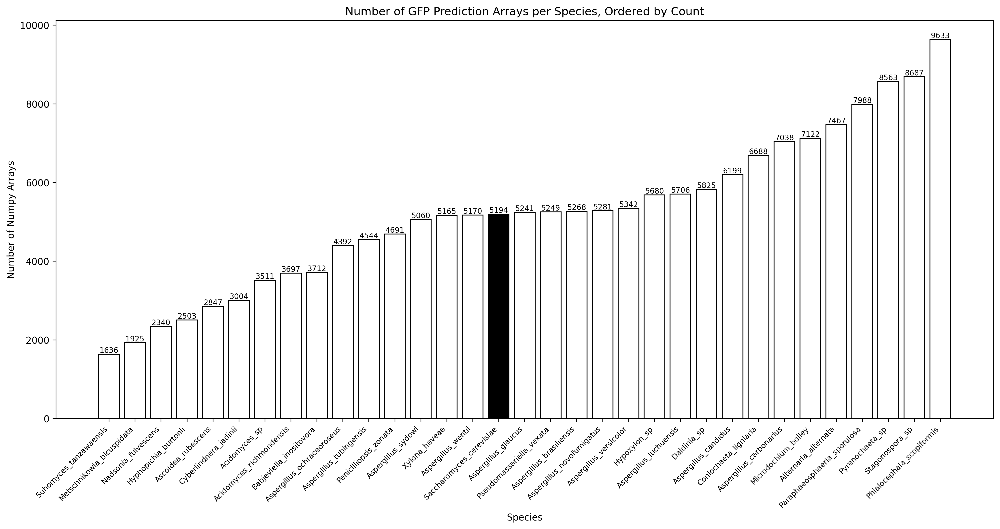

In [13]:

# Counting the number of numpy arrays for each species
num_arrays_per_species = [len(predictions) for predictions in species_GFP_predictions]

# Pair each species name with its count and then sort these pairs
sorted_pairs = sorted(zip(species_names, num_arrays_per_species), key=lambda x: x[1])

# Unzip the sorted pairs back into two lists
sorted_species_names, sorted_num_arrays = zip(*sorted_pairs)


plt.figure(figsize=(15, 8))

saccharomyces_index = sorted_species_names.index('Saccharomyces_cerevisiae')

for i, (species, count) in enumerate(zip(sorted_species_names, sorted_num_arrays)):
    color = 'black' if species == 'Saccharomyces_cerevisiae' else 'white'
    plt.bar(species, count, color=color, edgecolor='black')  # edgecolor makes the white bars visible

for i, count in enumerate(sorted_num_arrays):
    plt.text(i, count, '%d' % int(count), ha='center', va='bottom', fontsize=8)

plt.xlabel('Species')
plt.ylabel('Number of Numpy Arrays')
plt.title('Number of GFP Prediction Arrays per Species, Ordered by Count')

plt.xticks(rotation=45, ha='right', fontsize=8)  # Adjust fontsize as needed
plt.tight_layout()
plt.show()


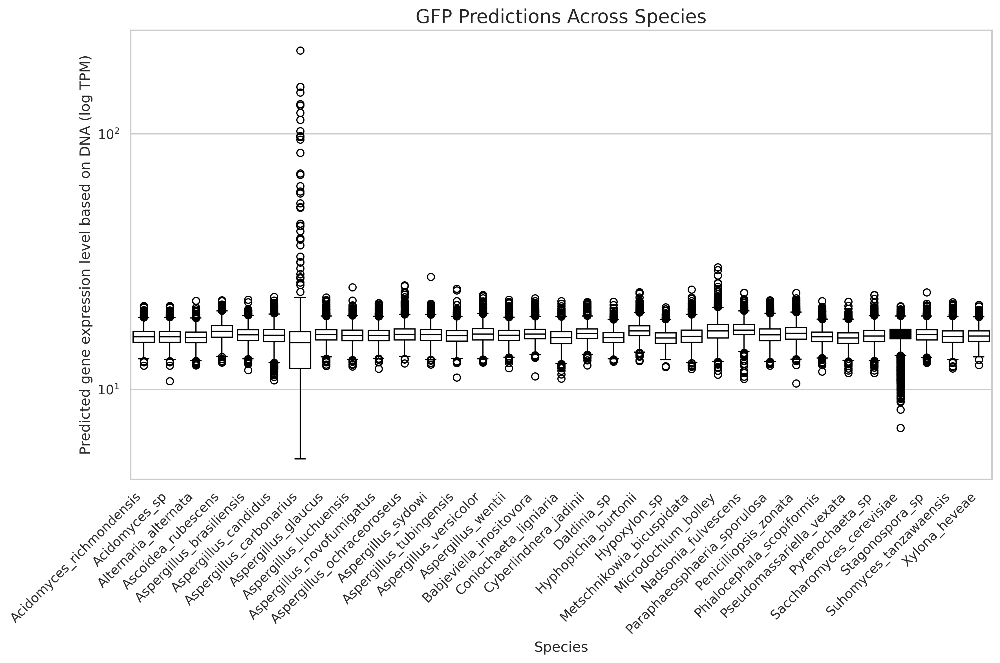

In [15]:

# Convert the updated list of numpy arrays into a long-format DataFrame
data_list = []
for i, predictions in enumerate(species_GFP_predictions):
    predictions_flat = predictions.flatten()
    for prediction in predictions_flat:
        data_list.append({'Species': species_names[i], 'GFP Prediction': prediction})

data_long_format = pd.DataFrame(data_list)

# Plotting
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
palette = {species: 'black' if species == 'Saccharomyces_cerevisiae' else 'white' for species in species_names}
box_plot = sns.boxplot(x='Species', y='GFP Prediction', data=data_long_format, palette=palette)
box_plot.set_xticklabels(box_plot.get_xticklabels(), rotation=45, horizontalalignment='right')
box_plot.set_ylabel('Predicted gene expression level based on DNA (log TPM)')
plt.title('GFP Predictions Across Species', fontsize=16)
plt.yscale('log')  # Set y-axis scale to log
plt.xlim([-0.5, len(species_names)-0.5])
plt.tight_layout()

plt.show()


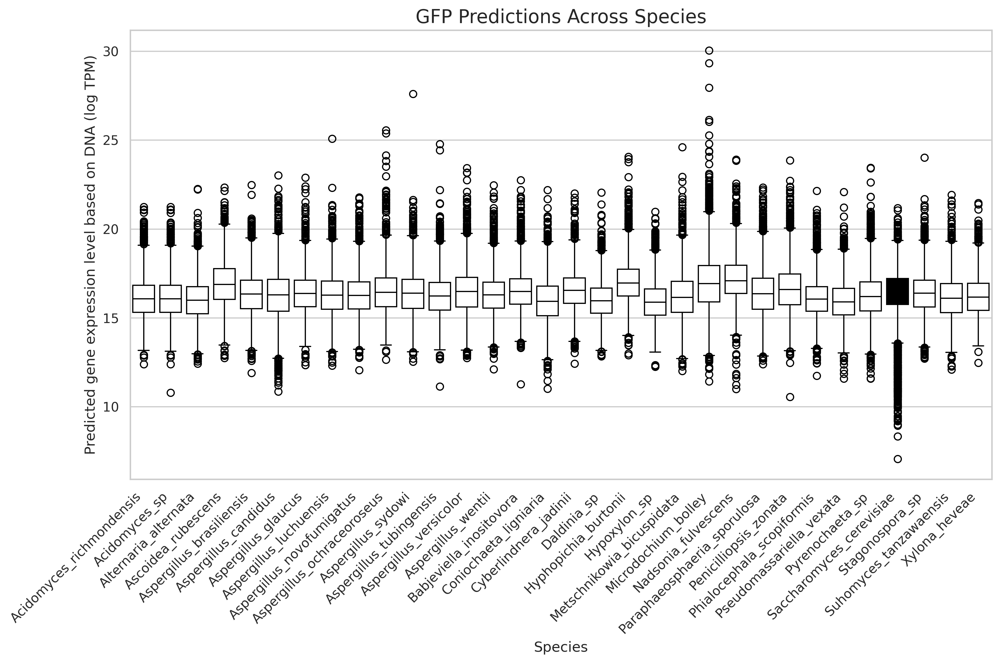

In [16]:


# Exclude the 7th value from predictions and names
filtered_predictions = [pred for idx, pred in enumerate(species_GFP_predictions) if idx != 6]
filtered_species_names = [name for idx, name in enumerate(species_names) if idx != 6]

# Convert the updated list of numpy arrays into a long-format DataFrame
data_list = []
for i, predictions in enumerate(filtered_predictions):
    predictions_flat = predictions.flatten()
    for prediction in predictions_flat:
        data_list.append({'Species': filtered_species_names[i], 'GFP Prediction': prediction})

data_long_format = pd.DataFrame(data_list)

# Plotting
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
palette = {species: 'black' if species == 'Saccharomyces_cerevisiae' else 'white' for species in filtered_species_names}
box_plot = sns.boxplot(x='Species', y='GFP Prediction', data=data_long_format, palette=palette)
box_plot.set_xticklabels(box_plot.get_xticklabels(), rotation=45, horizontalalignment='right')
box_plot.set_ylabel('Predicted gene expression level based on DNA (log TPM)')
plt.title('GFP Predictions Across Species', fontsize=16)
plt.xlim([-0.5, len(filtered_species_names)-0.5])
plt.tight_layout()
plt.show()


In [17]:
#Finding top 10 predictions for each species and their indicies

species_top10_ind = []  # Container for the DataFrames

for species_index, species_predictions in enumerate(species_GFP_predictions):
    # Flatten the 2D array to 1D to properly process the predictions
    flattened_predictions = species_predictions.flatten()
    
    # Now, sort the predictions to get the indices of the top 10 predictions
    sorted_indices = np.argsort(flattened_predictions)[-10:][::-1]
    
    # Extract these top predictions using the sorted indices
    top_predictions = flattened_predictions[sorted_indices]
    
    # Create a DataFrame for the current species with these top predictions and their indices
    df = pd.DataFrame({
        "Index": sorted_indices,
        "Prediction": top_predictions
    })
    
    # Adding species name to each DataFrame, assuming species_names list corresponds to each species
    df['Species'] = species_names[species_index]
    
    species_top10_ind.append(df)

# Example to display the DataFrame for the first species
species_top10_ind[0]


,Index,Prediction,Species
0,1760,21.241650,Acidomyces_richmondensis
1,756,21.094597,Acidomyces_richmondensis
2,298,21.070848,Acidomyces_richmondensis
3,3094,20.921564,Acidomyces_richmondensis
4,1948,20.430887,Acidomyces_richmondensis
5,3203,20.378632,Acidomyces_richmondensis
6,2679,20.325335,Acidomyces_richmondensis
7,2177,20.240730,Acidomyces_richmondensis
8,3337,20.170374,Acidomyces_richmondensis
9,2795,20.117819,Acidomyces_richmondensis


In [18]:
#Loading GFP_Xval to locate indicies of top 10 values


gfp_xval_dir = 'Dataset_Assembly/GFP_Xval'
GFP_Xval = []

# Iterate over each species name to load the corresponding .npy file
for species_name in species_names:
    #print(f"Loading data for species: {species_name}")  # Provides feedback on which species is being loaded
    
    # Construct the file path for the current species' .npy file
    file_path = os.path.join(gfp_xval_dir, f"{species_name}_Xval.npy")
    
    # Load the .npy file and append the data to the GFP_Xval list
    species_data = np.load(file_path, allow_pickle=True)
    GFP_Xval.append(species_data)




In [19]:
#Creating dataframe showing highest predictions and their region values

# Corrected names for the feature columns based on the mapping provided
feature_names = [
    'len_5u', 'len_cd', 'len_3u', 'gc_5u', 'gc_3u', 
    'GC1', 'GC2', 'GC3'
] + [f'freq_cd_{i+1}' for i in range(64)]  

# Container for the new DataFrames with corrected structure
species_top10_dfs = []

for df, xval_data in zip(species_top10_ind, GFP_Xval):
    # Extract indices of top 10 predictions from the DataFrame
    top_indices = df['Index'].values
    
    # Select the corresponding rows from the xval_data
    top_rows = xval_data[top_indices]
    
    # Create a new DataFrame with the specified labels for each feature
    new_df = pd.DataFrame(top_rows, columns=feature_names)
    
    # Insert species name and prediction at the beginning of the DataFrame
    new_df.insert(0, 'Prediction', df['Prediction'].values)
    new_df.insert(0, 'Species', df['Species'].iloc[0])
    
    species_top10_dfs.append(new_df)

# Example to display the DataFrame for the first species' top 10 corresponding xval data, with adjusted column names
species_top10_dfs[5]


,Species,Prediction,len_5u,len_cd,len_3u,gc_5u,gc_3u,GC1,GC2,GC3,...,freq_cd_55,freq_cd_56,freq_cd_57,freq_cd_58,freq_cd_59,freq_cd_60,freq_cd_61,freq_cd_62,freq_cd_63,freq_cd_64
0,Aspergillus_candidus,23.020956,1.0,720,82.0,0.0,421.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
1,Aspergillus_candidus,22.279362,54.0,720,158.0,272.0,358.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
2,Aspergillus_candidus,21.849611,11.0,720,54.0,250.0,290.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
3,Aspergillus_candidus,21.765886,30.0,720,28.0,64.0,310.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
4,Aspergillus_candidus,21.642492,12.0,720,11.0,846.0,416.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
5,Aspergillus_candidus,21.554035,0.0,720,170.0,0.0,350.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
6,Aspergillus_candidus,21.356224,54.0,720,0.0,454.0,0.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
7,Aspergillus_candidus,21.307798,0.0,720,57.0,0.0,241.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
8,Aspergillus_candidus,21.234354,58.0,720,28.0,661.0,482.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2
9,Aspergillus_candidus,21.148357,127.0,720,34.0,500.0,142.0,454,312,437,...,0,6,0,1,1,1,2,10,19,2


In [20]:

# Container for the new DataFrames excluding the top 10 predictions
non_top10_data_dfs = []

for i, (top_df, xval_data) in enumerate(zip(species_top10_ind, GFP_Xval)):
    # Indices of the top 10 predictions
    top_indices = set(top_df['Index'].values)
    
    # All indices in the dataset
    all_indices = set(range(xval_data.shape[0]))
    
    # Indices excluding the top 10
    non_top_indices = np.array(list(all_indices - top_indices))
    
    # Select the corresponding rows excluding the top 10
    non_top_rows = xval_data[non_top_indices]
    
    # Create a new DataFrame with the specified labels for each feature, excluding top 10
    non_top_df = pd.DataFrame(non_top_rows, columns=feature_names)
    
    # Adding species name for clarity, assuming a list 'species_names' matches indices
    non_top_df['Species'] = species_names[i]
    
    non_top10_data_dfs.append(non_top_df)

print(non_top10_data_dfs)

[     len_5u len_cd len_3u  gc_5u  gc_3u  GC1  GC2  GC3 freq_cd_1 freq_cd_2  \
0     218.0    720   83.0  456.0  380.0  454  312  437         6        13   
1     284.0    720   84.0  463.0  552.0  454  312  437         6        13   
2     109.0    720  172.0  454.0  531.0  454  312  437         6        13   
3     322.0    720  102.0  504.0  485.0  454  312  437         6        13   
4     200.0    720  468.0  422.0  515.0  454  312  437         6        13   
...     ...    ...    ...    ...    ...  ...  ...  ...       ...       ...   
3682  252.0    720  116.0  608.0  564.0  454  312  437         6        13   
3683  376.0    720  252.0  615.0  604.0  454  312  437         6        13   
3684  376.0    720  335.0  594.0  497.0  454  312  437         6        13   
3685   38.0    720  391.0  615.0  489.0  454  312  437         6        13   
3686  111.0    720  143.0  419.0  631.0  454  312  437         6        13   

      ... freq_cd_56 freq_cd_57 freq_cd_58 freq_cd_59 freq_cd_

In [21]:
# Initialize empty lists for storing the averages
avg_len_5u_non_top_list, avg_len_5u_top_list = [], []
avg_len_3u_non_top_list, avg_len_3u_top_list = [], []
avg_GC_5utr_non_top_list, avg_GC_5utr_top_list = [], []
avg_GC_3utr_non_top_list, avg_GC_3utr_top_list = [], []

# Loop through each pair of dataframes (non-top 10 and top 10) for all species
for i, (non_top_df, top_df) in enumerate(zip(non_top10_data_dfs, species_top10_dfs)):
    species_name = species_names[i]  # Assuming species_names is in the same order as dataframes
    
    # Calculate averages for non-top 10
    avg_len_5u_non_top = non_top_df['len_5u'].mean()
    avg_len_3u_non_top = non_top_df['len_3u'].mean()
    avg_gc_5u_non_top = non_top_df['gc_5u'].mean() / 1000
    avg_gc_3u_non_top = non_top_df['gc_3u'].mean() / 1000
    
    # Calculate averages for top 10
    avg_len_5u_top = top_df['len_5u'].mean()
    avg_len_3u_top = top_df['len_3u'].mean()
    avg_gc_5u_top = top_df['gc_5u'].mean() / 1000
    avg_gc_3u_top = top_df['gc_3u'].mean() / 1000
    
    # Append the averages to their respective lists
    avg_len_5u_non_top_list.append(avg_len_5u_non_top)
    avg_len_5u_top_list.append(avg_len_5u_top)
    avg_len_3u_non_top_list.append(avg_len_3u_non_top)
    avg_len_3u_top_list.append(avg_len_3u_top)
    avg_GC_5utr_non_top_list.append(avg_gc_5u_non_top)
    avg_GC_5utr_top_list.append(avg_gc_5u_top)
    avg_GC_3utr_non_top_list.append(avg_gc_3u_non_top)
    avg_GC_3utr_top_list.append(avg_gc_3u_top)

    # Print the averages for verification
    print(f"\nSpecies: {species_name}")
    print(f"Average 5' UTR Length - Non-Top 10: {avg_len_5u_non_top:.2f}, Top 10: {avg_len_5u_top:.2f}")
    print(f"Average 3' UTR Length - Non-Top 10: {avg_len_3u_non_top:.2f}, Top 10: {avg_len_3u_top:.2f}")
    print(f"Average 5' UTR GC Content - Non-Top 10: {avg_gc_5u_non_top:.2f}, Top 10: {avg_gc_5u_top:.2f}")
    print(f"Average 3' UTR GC Content - Non-Top 10: {avg_gc_3u_non_top:.2f}, Top 10: {avg_gc_3u_top:.2f}")



Species: Acidomyces_richmondensis
Average 5' UTR Length - Non-Top 10: 175.79, Top 10: 66.70
Average 3' UTR Length - Non-Top 10: 214.40, Top 10: 127.20
Average 5' UTR GC Content - Non-Top 10: 0.49, Top 10: 0.33
Average 3' UTR GC Content - Non-Top 10: 0.46, Top 10: 0.37

Species: Acidomyces_sp
Average 5' UTR Length - Non-Top 10: 178.02, Top 10: 73.70
Average 3' UTR Length - Non-Top 10: 216.97, Top 10: 108.20
Average 5' UTR GC Content - Non-Top 10: 0.49, Top 10: 0.34
Average 3' UTR GC Content - Non-Top 10: 0.46, Top 10: 0.39

Species: Alternaria_alternata
Average 5' UTR Length - Non-Top 10: 208.99, Top 10: 44.30
Average 3' UTR Length - Non-Top 10: 190.75, Top 10: 82.10
Average 5' UTR GC Content - Non-Top 10: 0.51, Top 10: 0.27
Average 3' UTR GC Content - Non-Top 10: 0.46, Top 10: 0.29

Species: Ascoidea_rubescens
Average 5' UTR Length - Non-Top 10: 170.97, Top 10: 31.10
Average 3' UTR Length - Non-Top 10: 180.10, Top 10: 100.70
Average 5' UTR GC Content - Non-Top 10: 0.35, Top 10: 0.10
A

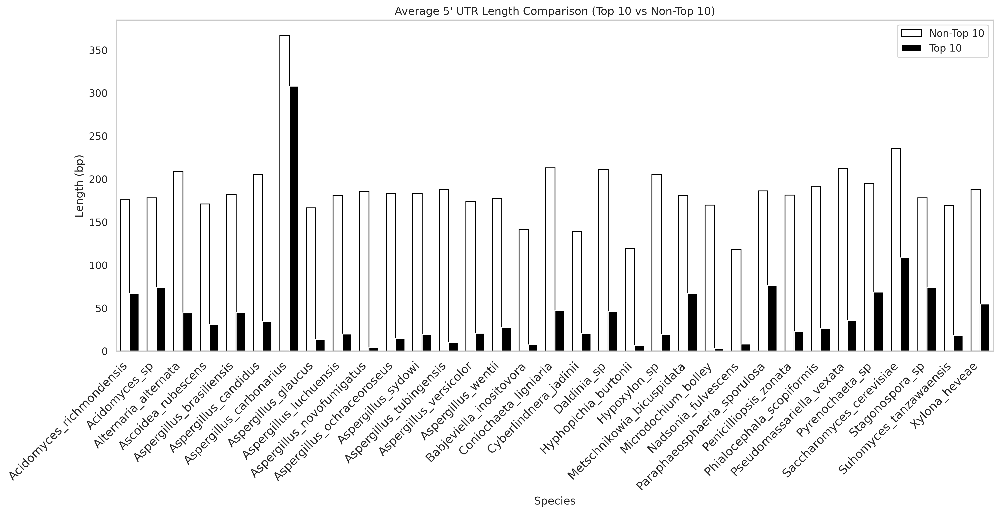

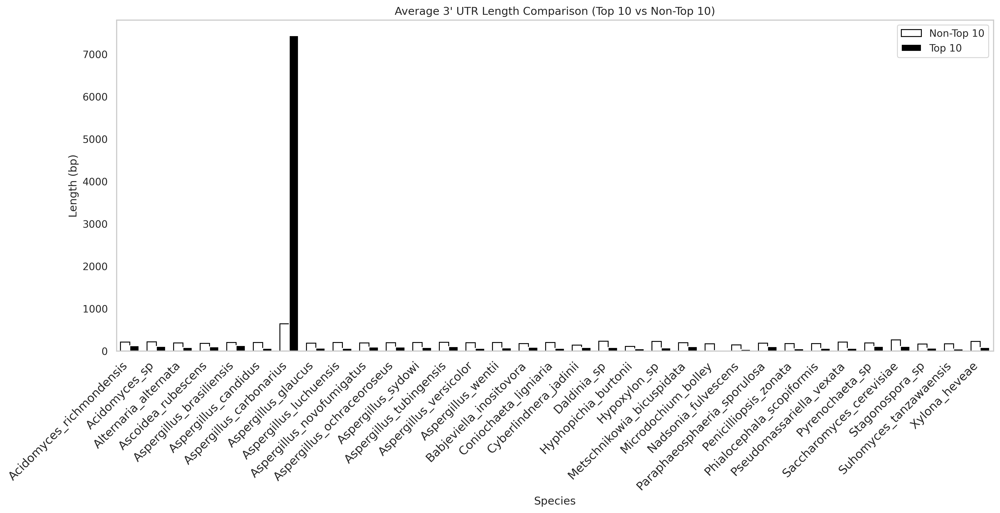

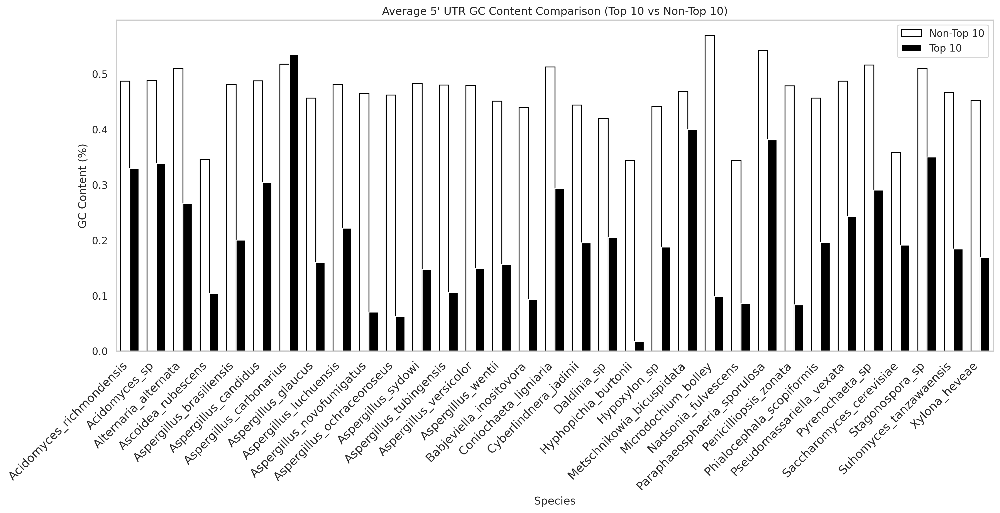

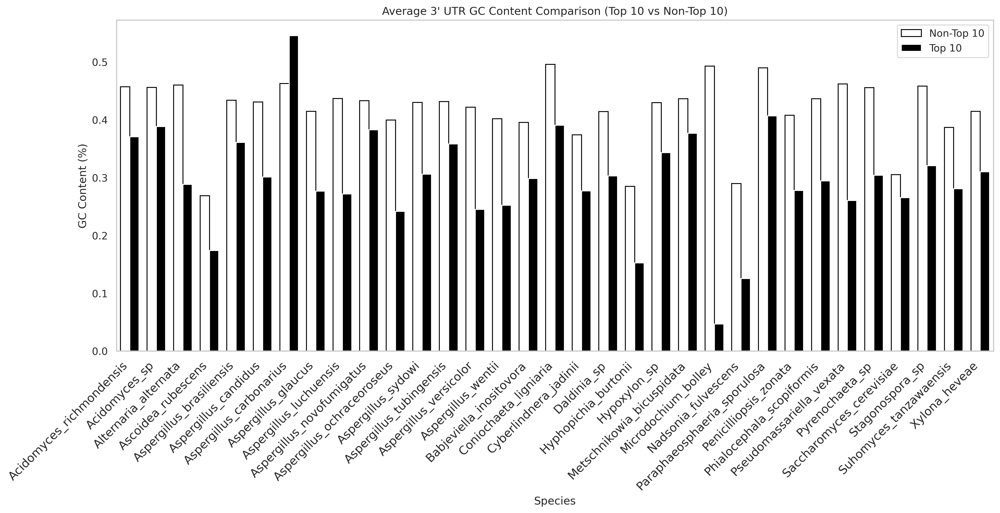

In [22]:
#Plotting comparisons 

def plot_comparison(species_names, non_top_values, top_values, title, ylabel):
    # Calculate the positions for each group + the width of each bar
    n_groups = len(species_names)
    index = range(n_groups)
    bar_width = 0.35

    
    plt.figure(figsize=(15, 8))

    
    plt.bar([i - bar_width / 2 for i in index], non_top_values, bar_width, label='Non-Top 10', color='white', edgecolor='black')
    plt.bar([i + bar_width / 2 for i in index], top_values, bar_width, label='Top 10', color='black')

    
    plt.xlabel('Species')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xticks(index, species_names, rotation=45, ha="right", fontsize=13)  

    
    plt.legend()
    plt.tight_layout(pad=1.0)  # Add some padding for labels not to be cut off
    plt.grid(False)  
    plt.xlim([-0.5, len(species_names)-0.5])
    plt.show()

# Example usage with the plotting function for different comparisons
plot_comparison(species_names, avg_len_5u_non_top_list, avg_len_5u_top_list, 
                "Average 5' UTR Length Comparison (Top 10 vs Non-Top 10)", "Length (bp)")
plot_comparison(species_names, avg_len_3u_non_top_list, avg_len_3u_top_list, 
                "Average 3' UTR Length Comparison (Top 10 vs Non-Top 10)", "Length (bp)")
plot_comparison(species_names, avg_GC_5utr_non_top_list, avg_GC_5utr_top_list, 
                "Average 5' UTR GC Content Comparison (Top 10 vs Non-Top 10)", "GC Content (%)")
plot_comparison(species_names, avg_GC_3utr_non_top_list, avg_GC_3utr_top_list, 
                "Average 3' UTR GC Content Comparison (Top 10 vs Non-Top 10)", "GC Content (%)")


In [23]:
def calculate_range(values):
    return max(values) - min(values) if values else 0

# Assuming avg_len_5u_non_top_list, avg_len_5u_top_list, etc., are already defined
range_len_5u_non_top = calculate_range(avg_len_5u_non_top_list)
range_len_5u_top = calculate_range(avg_len_5u_top_list)
range_len_3u_non_top = calculate_range(avg_len_3u_non_top_list)
range_len_3u_top = calculate_range(avg_len_3u_top_list)

range_gc_5utr_non_top = calculate_range(avg_GC_5utr_non_top_list)
range_gc_5utr_top = calculate_range(avg_GC_5utr_top_list)
range_gc_3utr_non_top = calculate_range(avg_GC_3utr_non_top_list)
range_gc_3utr_top = calculate_range(avg_GC_3utr_top_list)

# Print the ranges
print("Range of 5' UTR Length - Non-Top 10:", range_len_5u_non_top)
print("Range of 5' UTR Length - Top 10:", range_len_5u_top)
print("Range of 3' UTR Length - Non-Top 10:", range_len_3u_non_top)
print("Range of 3' UTR Length - Top 10:", range_len_3u_top)
print("Range of 5' UTR GC Content - Non-Top 10:", range_gc_5utr_non_top)
print("Range of 5' UTR GC Content - Top 10:", range_gc_5utr_top)
print("Range of 3' UTR GC Content - Non-Top 10:", range_gc_3utr_non_top)
print("Range of 3' UTR GC Content - Top 10:", range_gc_3utr_top)


Range of 5' UTR Length - Non-Top 10: 248.399499732523
Range of 5' UTR Length - Top 10: 304.79999999999995
Range of 3' UTR Length - Non-Top 10: 534.4262199953838
Range of 3' UTR Length - Top 10: 7426.0
Range of 5' UTR GC Content - Non-Top 10: 0.22535154631958548
Range of 5' UTR GC Content - Top 10: 0.5177
Range of 3' UTR GC Content - Non-Top 10: 0.22733471645963582
Range of 3' UTR GC Content - Top 10: 0.4987


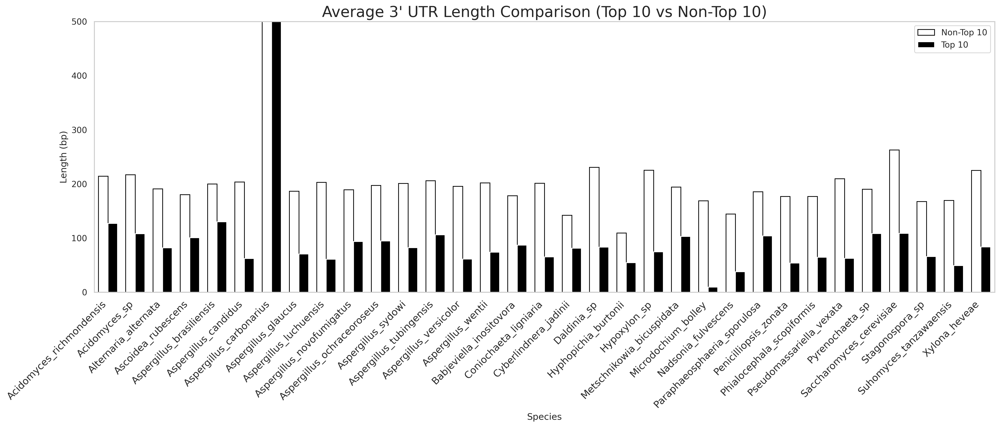

In [26]:

def plot_comparison(species_names, non_top_values, top_values, title, ylabel):
    # Calculate the positions for each group + the width of each bar
    n_groups = len(species_names)
    index = range(n_groups)
    bar_width = 0.35

    
    plt.figure(figsize=(18, 8))  

    
    plt.bar([i - bar_width / 2 for i in index], non_top_values, bar_width, label='Non-Top 10', color='white', edgecolor='black')
    plt.bar([i + bar_width / 2 for i in index], top_values, bar_width, label='Top 10', color='black')

   
    plt.xlabel('Species')
    plt.ylabel(ylabel)
    plt.title(title, fontsize=20)
    plt.xticks(index, species_names, rotation=45, ha="right", fontsize=13) 

    
    plt.legend()
    plt.tight_layout(pad=1.0)  
    plt.grid(False)  
    plt.xlim([-0.5, len(species_names)-0.5])
    plt.ylim(0, 500)  # Set the y-axis limit to 500
    plt.show()

# Usage with the plotting function for 3' UTR length comparison
plot_comparison(species_names, avg_len_3u_non_top_list, avg_len_3u_top_list, 
                "Average 3' UTR Length Comparison (Top 10 vs Non-Top 10)", "Length (bp)")
